In [1]:
! nvidia-smi

Thu Aug 17 04:28:42 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.105.17   Driver Version: 525.105.17   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   53C    P8    10W /  70W |      0MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [2]:
!git clone https://github.com/akanametov/yolov8-face

Cloning into 'yolov8-face'...
remote: Enumerating objects: 3085, done.
remote: Total 3085 (delta 0), reused 0 (delta 0), pack-reused 3085
Receiving objects: 100% (3085/3085), 27.03 MiB | 33.75 MiB/s, done.
Resolving deltas: 100% (2060/2060), done.


In [3]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 612.0/612.0 kB 7.4 MB/s eta 0:00:00


In [13]:
# define helper functions
def imShow(path):
  import cv2
  import matplotlib.pyplot as plt
  %matplotlib inline

  image = cv2.imread(path)
  height, width = image.shape[:2]
  resized_image = cv2.resize(image,(3*width, 3*height), interpolation = cv2.INTER_CUBIC)

  fig = plt.gcf()
  fig.set_size_inches(18, 10)
  plt.axis("off")
  plt.imshow(cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB))
  plt.show()

# use this to upload files
def upload():
  from google.colab import files
  uploaded = files.upload()
  for name, data in uploaded.items():
    with open(name, 'wb') as f:
      f.write(data)
      print ('saved file', name)

# use this to download a file
def download(path):
  from google.colab import files
  files.download(path)

In [10]:
# uploading "yolov8n-face.pt" pre-trained face detection model
%cd yolov8-face
upload()

[Errno 2] No such file or directory: 'yolov8-face'
/content/yolov8-face


Saving yolov8n-face.pt to yolov8n-face.pt
saved file yolov8n-face.pt


In [11]:
!yolo task=detect mode=predict model=yolov8n-face.pt conf=0.25 imgsz=1280 line_thickness=1 max_det=1000 source=examples/face.jpg

WARNING ⚠️ 'line_thickness' is deprecated and will be removed in 'ultralytics 8.2' in the future. Please use 'line_width' instead.
WARNING ⚠️ yolov8n-face.pt appears to require 'omegaconf', which is not in ultralytics requirements.
AutoInstall will run now for 'omegaconf' but this feature will be removed in the future.
Recommend fixes are to train a new model using the latest 'ultralytics' package or to run a command with an official YOLOv8 model, i.e. 'yolo predict model=yolov8n.pt'
requirements: Ultralytics requirement ['omegaconf'] not found, attempting AutoUpdate...
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.5/79.5 kB 3.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 117.0/117.0 kB 10.0 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for antlr4-python3-runtime: filename=antlr4_python3_runtime-4.9.3-py3-none-any.whl size=144555 sha256=0c8bd2364369366d688d4780bd636954a84b23c00c

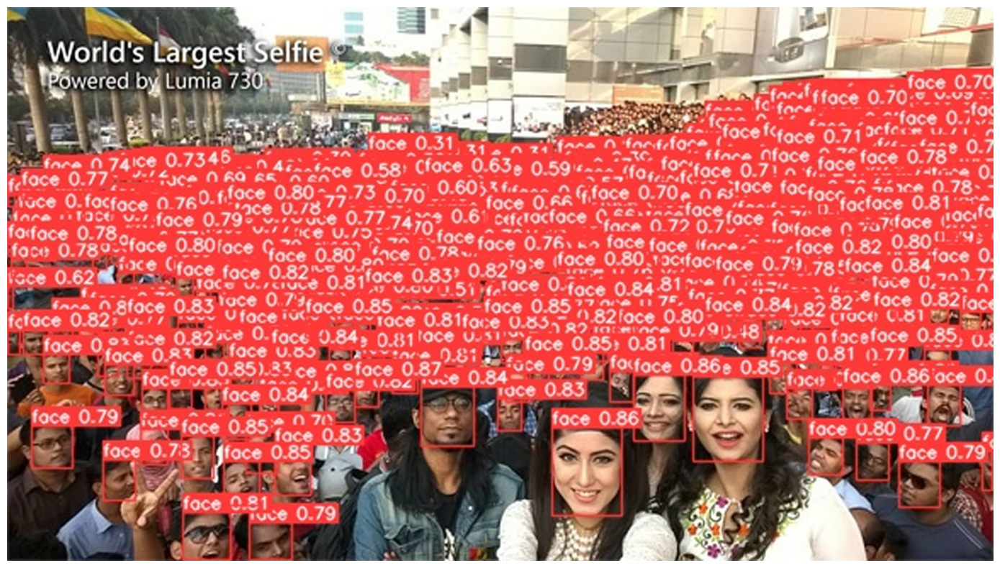

In [29]:
imShow('runs/detect/predict/face.jpg')

In [16]:
# uploading testing folder
%cd /content/yolov8-face/examples
upload()
%cd /content/yolov8-face

/content/yolov8-face/examples


Saving test1.jpg to test1.jpg
Saving test2.jpg to test2.jpg
Saving test3.jpg to test3.jpg
Saving test4.jpg to test4.jpg
Saving test5.jpeg to test5.jpeg
Saving test6.jpeg to test6.jpeg
Saving test7.jpg to test7.jpg
Saving test8.jpg to test8.jpg
saved file test1.jpg
saved file test2.jpg
saved file test3.jpg
saved file test4.jpg
saved file test5.jpeg
saved file test6.jpeg
saved file test7.jpg
saved file test8.jpg
/content/yolov8-face


In [38]:
!yolo task=detect mode=predict model=yolov8n-face.pt conf=0.25 imgsz=1280 line_width=1 max_det=1000 source=examples
# https://stackoverflow.com/questions/55288657/image-is-not-displaying-in-google-colab-while-using-imshow

Ultralytics YOLOv8.0.156 🚀 Python-3.10.12 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 3005843 parameters, 0 gradients

image 1/9 /content/yolov8-face/examples/face.jpg: 736x1280 528 faces, 87.4ms
image 2/9 /content/yolov8-face/examples/test1.jpg: 1184x1280 21 faces, 49.6ms
image 3/9 /content/yolov8-face/examples/test2.jpg: 864x1280 40 faces, 253.3ms
image 4/9 /content/yolov8-face/examples/test3.jpg: 864x1280 151 faces, 24.0ms
image 5/9 /content/yolov8-face/examples/test4.jpg: 864x1280 12 faces, 14.1ms
image 6/9 /content/yolov8-face/examples/test5.jpeg: 864x1280 5 faces, 14.2ms
image 7/9 /content/yolov8-face/examples/test6.jpeg: 864x1280 17 faces, 14.2ms
image 8/9 /content/yolov8-face/examples/test7.jpg: 864x1280 22 faces, 14.1ms
image 9/9 /content/yolov8-face/examples/test8.jpg: 736x1280 528 faces, 12.6ms
Speed: 10.1ms preprocess, 53.7ms inference, 1.6ms postprocess per image at shape (1, 3, 736, 1280)
Results saved to runs/detect/predict5


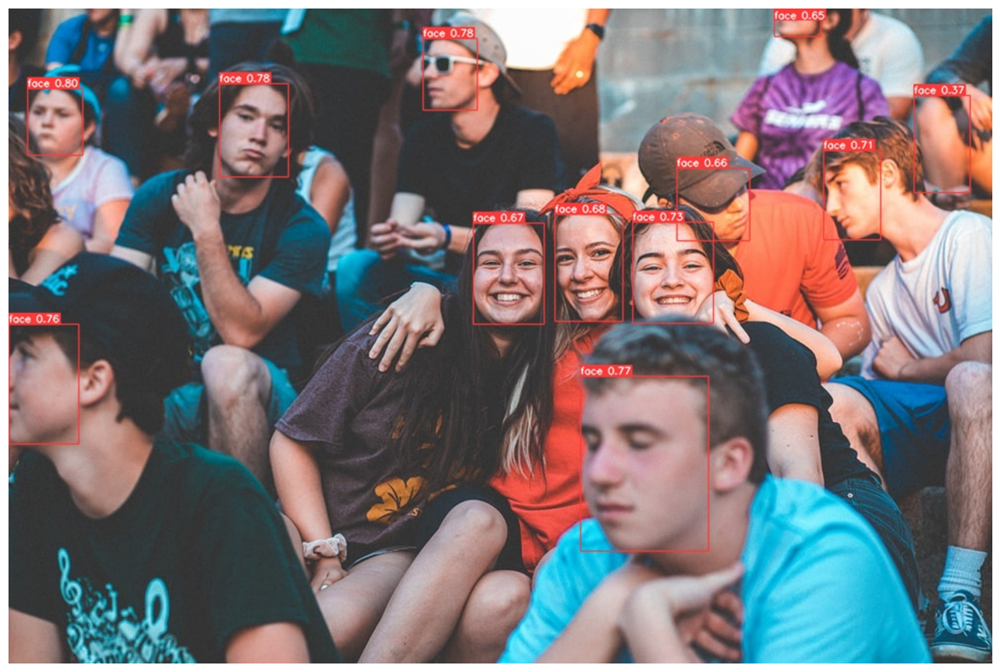

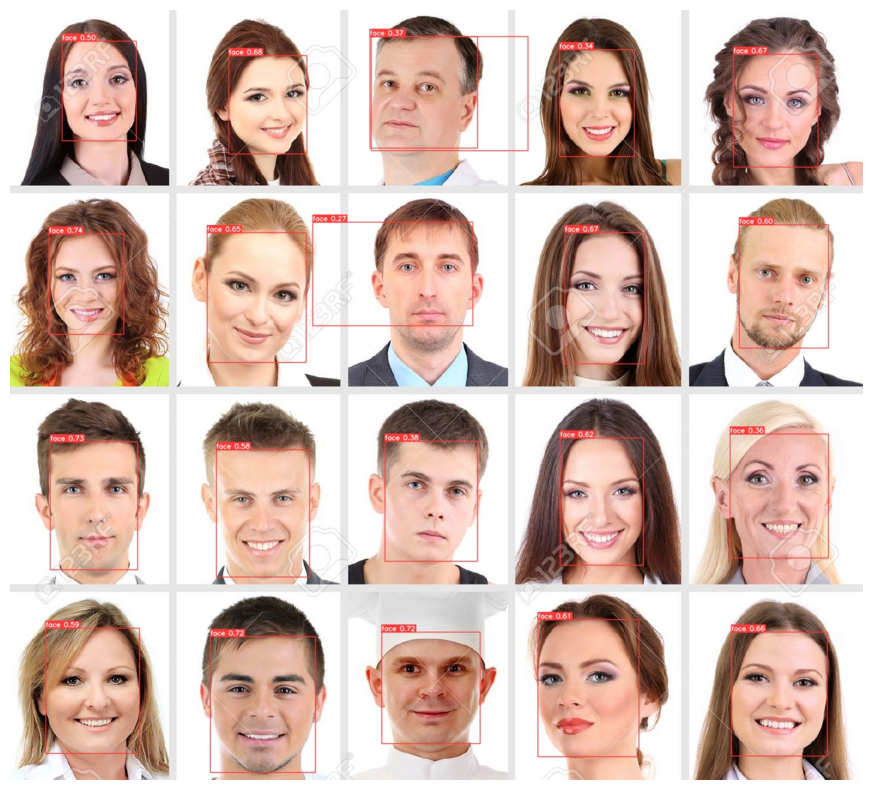

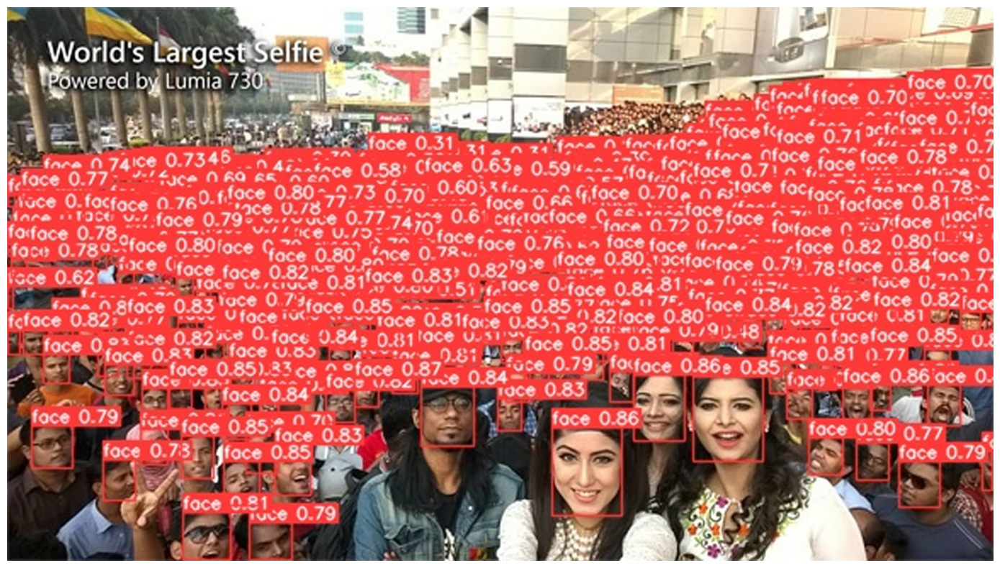

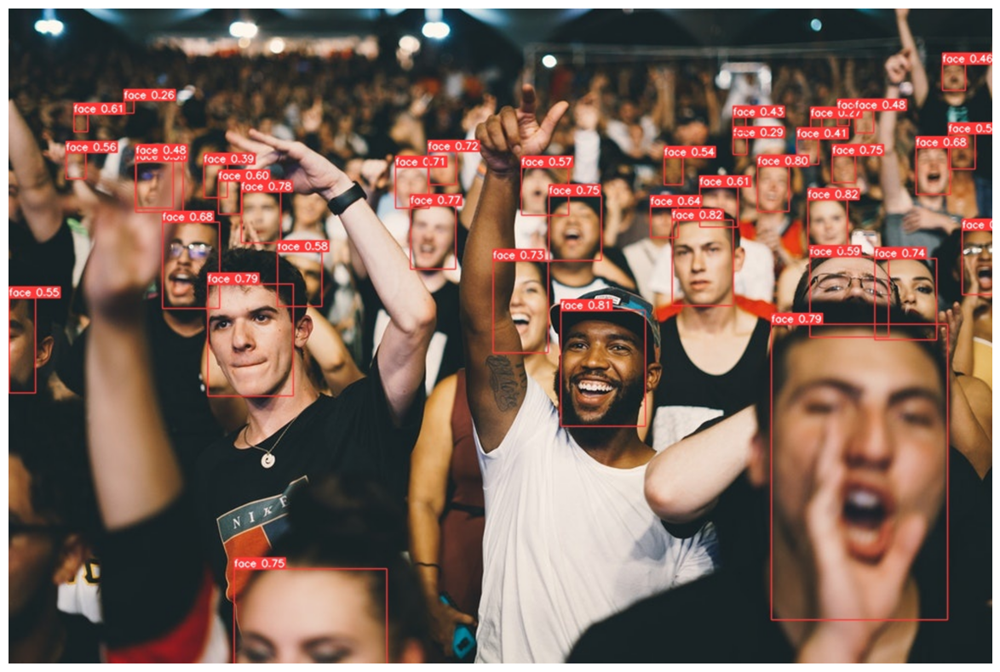

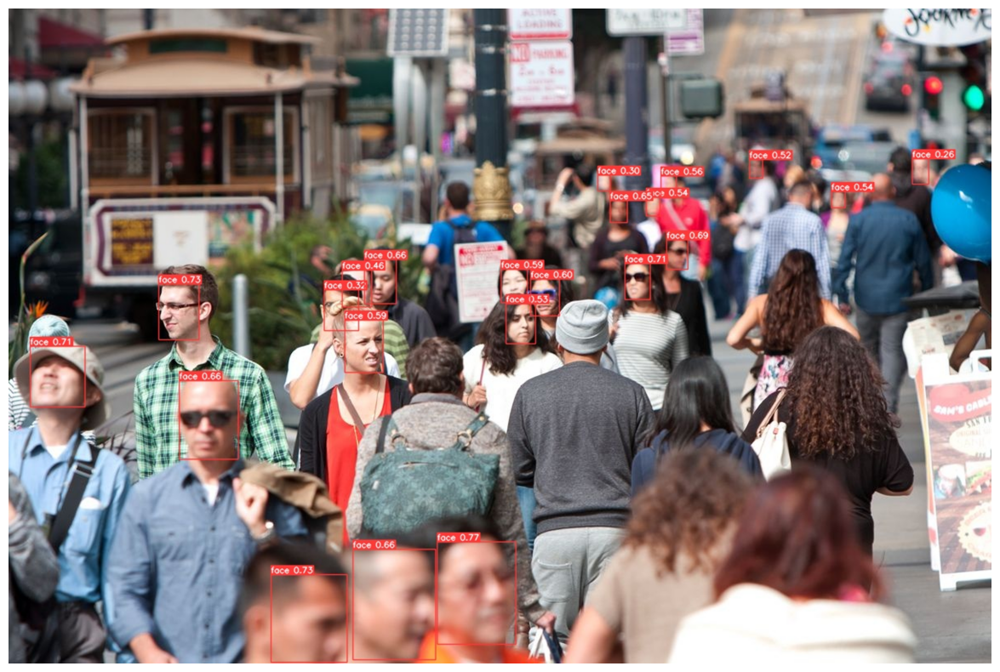

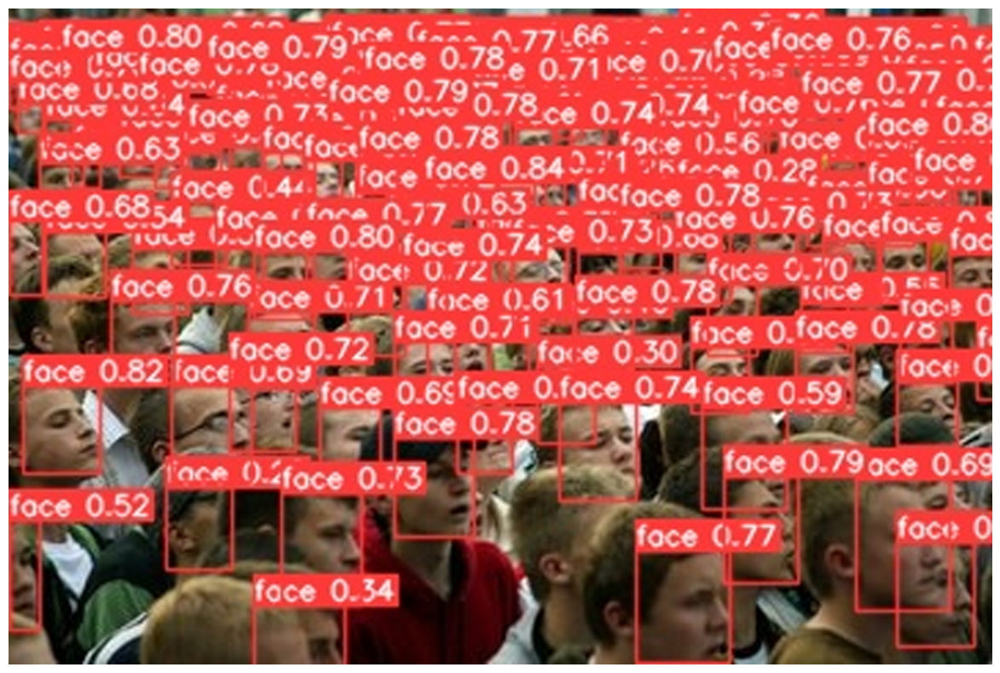

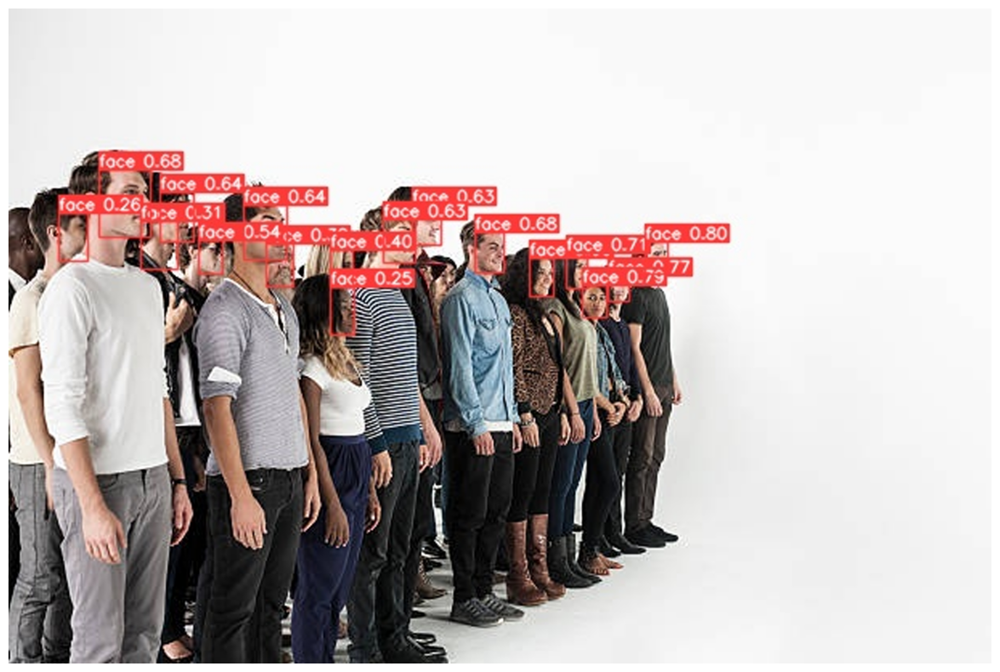

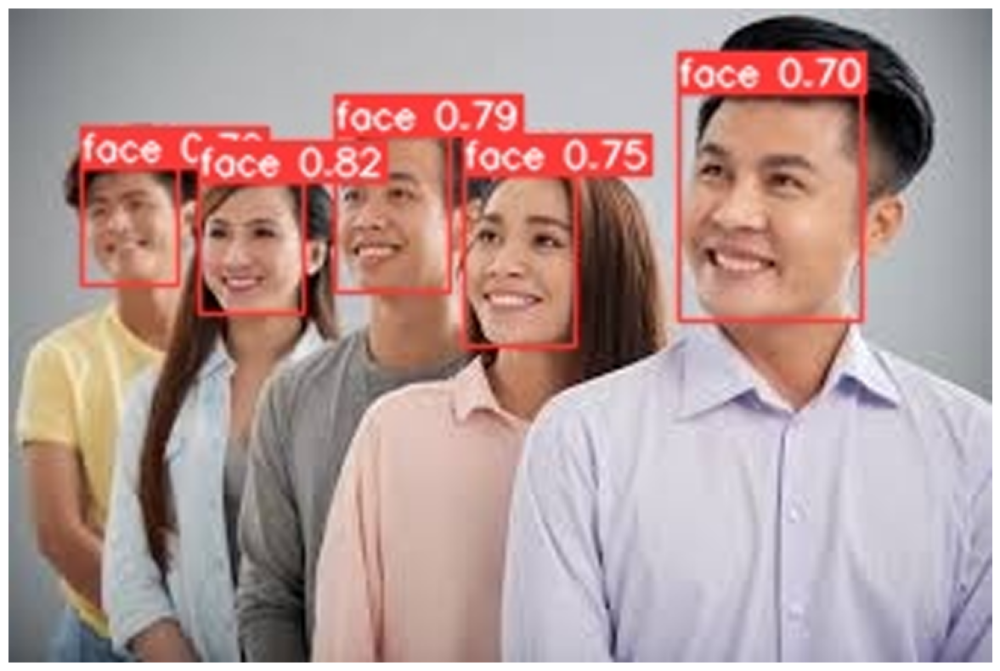

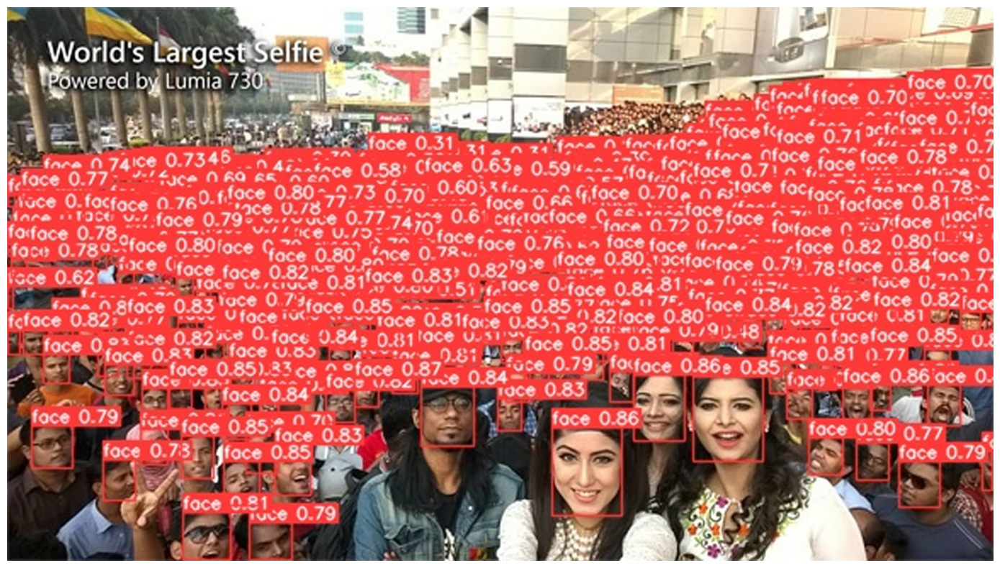

In [40]:
import glob
PATH = glob.glob("/content/yolov8-face/runs/detect/predict5/*")
for i in PATH:
  imShow(i)